#Detectron 2 for Object Detection


---


##Introduction

This is a programming assignment on fine-tuning an object detection model. We will use Detectron2 software (https://github.com/facebookresearch/detectron2). 

It is high-level wrapped code for object detection powered by PyTorch. Though
Detectron2 supports multiple computer vision tasks, including instance segmentation, we will only use its object detection functionality in this assignment.

##Install and Import Necessary Libraries

In [20]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)

# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions

!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html

!pip install 'git+https://github.com/facebookresearch/detectron2.git'

# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
torch:  1.12 ; cuda:  cu113
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu113/torch1.12/index.html
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/facebookresearch/detectron2.git to /tmp/pip-req-build-mr6kkqbl
  Running command git clone -q https://github.com/facebookresearch/detectron2.git /tmp/pip-req-build-mr6kkqbl


The task is to fine-tune a Faster RCNN objection detection model. The pretrained
model can be found in Detectron2 model zoo

In [21]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

## Load Dataset

We will use the Pascal VOC dataset for object detection (pretrained model is trained on MSCOCO dataset). We need to download the dataset to Colab.


In [22]:
!wget http://host.robots.ox.ac.uk/pascal/VOC/voc2007/VOCtrainval_06-Nov-2007.tar
!tar -xvf VOCtrainval_06-Nov-2007.tar

Streaming output truncated to the last 5000 lines.
VOCdevkit/VOC2007/JPEGImages/001732.jpg
VOCdevkit/VOC2007/JPEGImages/001733.jpg
VOCdevkit/VOC2007/JPEGImages/001734.jpg
VOCdevkit/VOC2007/JPEGImages/001738.jpg
VOCdevkit/VOC2007/JPEGImages/001739.jpg
VOCdevkit/VOC2007/JPEGImages/001741.jpg
VOCdevkit/VOC2007/JPEGImages/001746.jpg
VOCdevkit/VOC2007/JPEGImages/001747.jpg
VOCdevkit/VOC2007/JPEGImages/001749.jpg
VOCdevkit/VOC2007/JPEGImages/001750.jpg
VOCdevkit/VOC2007/JPEGImages/001752.jpg
VOCdevkit/VOC2007/JPEGImages/001754.jpg
VOCdevkit/VOC2007/JPEGImages/001755.jpg
VOCdevkit/VOC2007/JPEGImages/001756.jpg
VOCdevkit/VOC2007/JPEGImages/001758.jpg
VOCdevkit/VOC2007/JPEGImages/001759.jpg
VOCdevkit/VOC2007/JPEGImages/001761.jpg
VOCdevkit/VOC2007/JPEGImages/001765.jpg
VOCdevkit/VOC2007/JPEGImages/001766.jpg
VOCdevkit/VOC2007/JPEGImages/001768.jpg
VOCdevkit/VOC2007/JPEGImages/001771.jpg
VOCdevkit/VOC2007/JPEGImages/001772.jpg
VOCdevkit/VOC2007/JPEGImages/001775.jpg
VOCdevkit/VOC2007/JPEGImages/

In [23]:
!mv VOCdevkit datasets

In [24]:
import detectron2.data.datasets.pascal_voc as pascal_voc

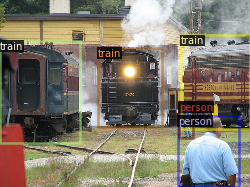

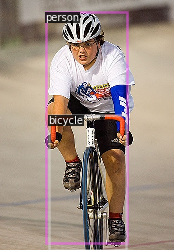

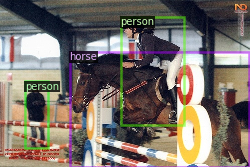

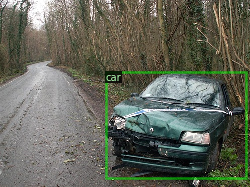

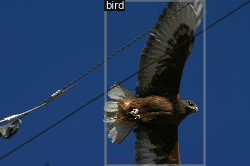

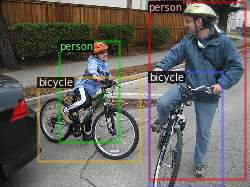

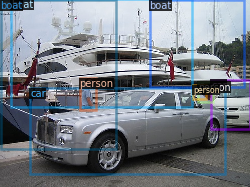

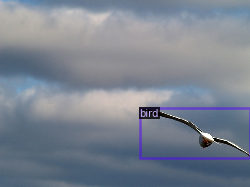

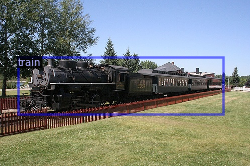

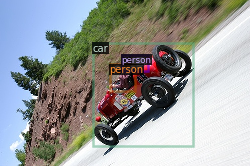

In [25]:

META = MetadataCatalog.get("voc_2007_train")

dataset_dicts = pascal_voc.load_voc_instances("datasets/VOC2007","train",pascal_voc.CLASS_NAMES)
for d in random.sample(dataset_dicts, 10):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1],metadata=META, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

## Config
Detectron2 provide a config dictionary, so that we can easily setup the experiment.

In [26]:
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/retinanet_R_50_FPN_3x.yaml"))
cfg.OUTPUT_DIR = 'MyVOCTraining'
cfg.DATASETS.TRAIN = ("voc_2007_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 1
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/retinanet_R_50_FPN_3x.yaml") # Let training initialize from model zoo

cfg.SOLVER.IMS_PER_BATCH = 1
cfg.SOLVER.BASE_LR = 0.00025 # pick a good LR
cfg.SOLVER.MAX_ITER = 1000
# cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 128
cfg.MODEL.RETINANET.BATCH_SIZE_PER_IMAGE =128
# cfg.MODEL.ROI_HEADS.NUM_CLASSES = 20
cfg.MODEL.RETINANET.NUM_CLASSES = 20

#----------


## Train


In [27]:
from detectron2.engine import DefaultTrainer
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = DefaultTrainer(cfg) 

[09/02 04:06:14 d2.engine.defaults]: Model:
RetinaNet(
  (backbone): FPN(
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelP6P7(
      (p6): Conv2d(2048, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
      (p7): Conv2d(256, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    )
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res2)

In [28]:
trainer.resume_or_load(resume=False)
trainer.train()

head.cls_score.{bias, weight}
  pixel_mean
  pixel_std


[09/02 04:06:15 d2.engine.train_loop]: Starting training from iteration 0
[09/02 04:06:20 d2.utils.events]:  eta: 0:03:55  iter: 19  total_loss: 0.9088  loss_cls: 0.7578  loss_box_reg: 0.09587  time: 0.2378  data_time: 0.0182  lr: 4.9953e-06  max_mem: 1401M
[09/02 04:06:25 d2.utils.events]:  eta: 0:03:49  iter: 39  total_loss: 0.7426  loss_cls: 0.6351  loss_box_reg: 0.09256  time: 0.2445  data_time: 0.0075  lr: 9.9902e-06  max_mem: 1401M
[09/02 04:06:30 d2.utils.events]:  eta: 0:03:50  iter: 59  total_loss: 1.158  loss_cls: 1.054  loss_box_reg: 0.1035  time: 0.2465  data_time: 0.0100  lr: 1.4985e-05  max_mem: 1401M
[09/02 04:06:34 d2.utils.events]:  eta: 0:03:41  iter: 79  total_loss: 1.325  loss_cls: 1.114  loss_box_reg: 0.1992  time: 0.2407  data_time: 0.0027  lr: 1.998e-05  max_mem: 1401M
[09/02 04:06:39 d2.utils.events]:  eta: 0:03:31  iter: 99  total_loss: 0.9888  loss_cls: 0.9191  loss_box_reg: 0.1096  time: 0.2379  data_time: 0.0033  lr: 2.4975e-05  max_mem: 1401M
[09/02 04:06:4

In [29]:
%load_ext tensorboard
%tensorboard --logdir "MyVOCTraining"

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 620), started 0:22:12 ago. (Use '!kill 620' to kill it.)

<IPython.core.display.Javascript object>

## Test

In [30]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained


# cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.3   # set a custom testing threshold
cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.3

predictor = DefaultPredictor(cfg)

[09/02 04:09:58 d2.checkpoint.c2_model_loading]: Following weights matched with model:
| Names in Model                       | Names in Checkpoint                                                                                  | Shapes                                          |
|:-------------------------------------|:-----------------------------------------------------------------------------------------------------|:------------------------------------------------|
| backbone.bottom_up.res2.0.conv1.*    | backbone.bottom_up.res2.0.conv1.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,1,1)             |
| backbone.bottom_up.res2.0.conv2.*    | backbone.bottom_up.res2.0.conv2.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight}    | (64,) (64,) (64,) (64,) (64,64,3,3)             |
| backbone.bottom_up.res2.0.conv3.*    | backbone.bottom_up.res2.0.conv3.{norm.bias,norm.running_mean,norm.running_var,norm.weight,weight

2510
Instances(num_instances=4, image_height=375, image_width=500, fields=[pred_boxes: Boxes(tensor([[ 21.9219,   8.2770, 387.9186, 366.8126],
        [164.1457,   4.5353, 500.0000, 366.4552],
        [137.4561,   5.4277, 500.0000, 366.0737],
        [ 21.7378,   6.6631, 330.9321, 363.3162]], device='cuda:0')), scores: tensor([0.8562, 0.6767, 0.5278, 0.3664], device='cuda:0'), pred_classes: tensor([7, 7, 2, 2], device='cuda:0')])


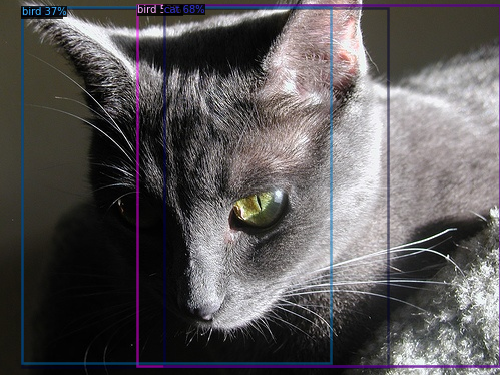

Instances(num_instances=10, image_height=375, image_width=500, fields=[pred_boxes: Boxes(tensor([[235.5263,  61.3627, 374.1969, 284.4709],
        [181.1809,  99.2847, 408.5979, 310.4009],
        [234.3828,  58.0847, 376.8746, 287.2579],
        [128.3561, 141.7088, 438.7653, 320.2443],
        [181.1809,  99.2847, 408.5979, 310.4009],
        [157.2394, 141.4806, 315.5683, 313.6866],
        [132.8208, 137.5752, 446.6172, 318.4503],
        [ 96.1663,  56.9157, 458.9254, 268.8915],
        [129.4231, 133.0207, 451.9843, 325.5876],
        [214.2806,  62.7650, 382.2287, 312.5724]], device='cuda:0')), scores: tensor([0.9523, 0.8523, 0.5961, 0.5421, 0.5319, 0.4501, 0.3437, 0.3190, 0.3166,
        0.3159], device='cuda:0'), pred_classes: tensor([14, 13, 13,  3, 14, 13,  8, 13,  6, 15], device='cuda:0')])


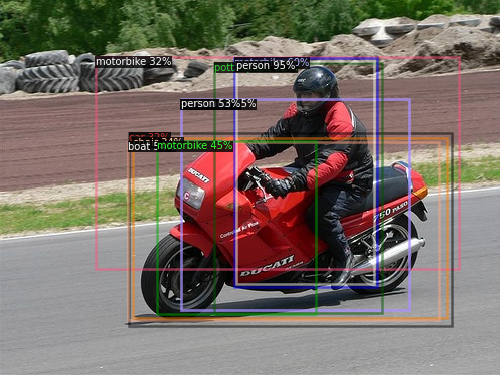

Instances(num_instances=1, image_height=375, image_width=500, fields=[pred_boxes: Boxes(tensor([[ 24.2730, 164.4326, 327.3439, 263.3453]], device='cuda:0')), scores: tensor([0.3837], device='cuda:0'), pred_classes: tensor([18], device='cuda:0')])


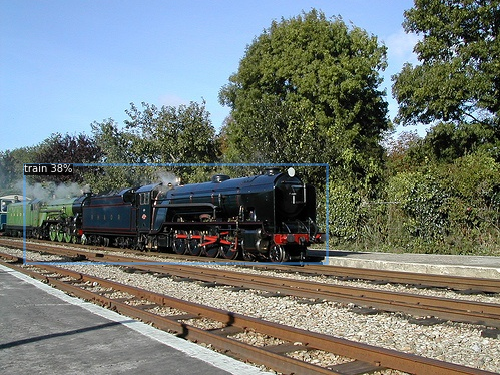

Instances(num_instances=6, image_height=333, image_width=500, fields=[pred_boxes: Boxes(tensor([[ 92.0822,  71.7944, 391.1738, 199.0691],
        [192.6850,  90.7508, 216.2206, 114.2571],
        [332.4568, 119.1767, 384.7533, 201.1656],
        [ 83.5319,  70.5773, 378.4863, 198.6970],
        [ 92.0822,  71.7944, 391.1738, 199.0691],
        [187.5858,  91.4266, 225.5151, 121.4168]], device='cuda:0')), scores: tensor([0.9266, 0.6340, 0.5215, 0.3937, 0.3624, 0.3097], device='cuda:0'), pred_classes: tensor([ 6, 14, 13,  3,  0, 14], device='cuda:0')])


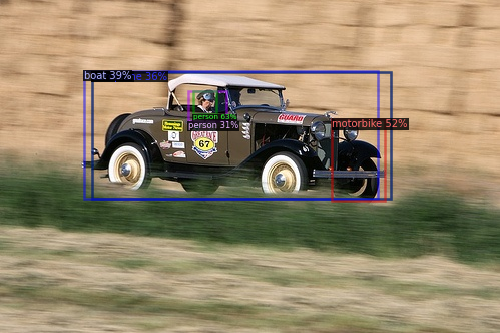

Instances(num_instances=8, image_height=375, image_width=500, fields=[pred_boxes: Boxes(tensor([[104.3162, 215.8332, 286.3397, 372.1942],
        [  0.0000, 118.7462, 211.7139, 374.6678],
        [202.9183,  21.1546, 455.1329, 375.0000],
        [327.8607, 156.6185, 500.0000, 373.1600],
        [  0.0000, 118.7462, 211.7139, 374.6678],
        [104.3162, 215.8332, 286.3397, 372.1942],
        [  0.0000, 114.6263, 215.6208, 367.7002],
        [133.0092, 206.2115, 289.3414, 371.3679]], device='cuda:0')), scores: tensor([0.9054, 0.4551, 0.4397, 0.4009, 0.3227, 0.3195, 0.3059, 0.3000],
       device='cuda:0'), pred_classes: tensor([ 7,  8, 14,  8,  7,  8,  2, 10], device='cuda:0')])


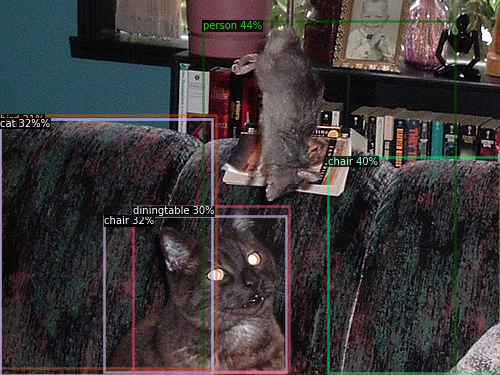

Instances(num_instances=30, image_height=375, image_width=500, fields=[pred_boxes: Boxes(tensor([[305.3019, 136.2718, 355.9683, 297.0457],
        [ 56.1606, 142.3968,  96.6149, 244.6195],
        [393.4149, 133.9716, 437.6825, 260.1501],
        [273.4702, 137.4566, 304.3000, 184.6175],
        [224.4459, 129.8842, 274.4920, 181.8447],
        [187.8049, 142.9344, 218.0664, 185.8870],
        [  7.0332, 173.6254, 104.5789, 237.5676],
        [416.3362, 132.4667, 441.7727, 165.8184],
        [252.2859, 176.4382, 326.8384, 291.3156],
        [ 10.5509, 174.9833, 102.0986, 236.3934],
        [ 44.2634, 145.1021,  93.1767, 240.5194],
        [350.3337, 158.4234, 420.8596, 250.2807],
        [415.1017, 133.4014, 442.9915, 216.9548],
        [169.6994, 164.8536, 218.6066, 222.1517],
        [196.2732, 179.8673, 232.6629, 238.5983],
        [458.2360, 162.9988, 500.0000, 241.9796],
        [367.6736, 145.9111, 443.7632, 257.4900],
        [457.2928, 157.5150, 500.0000, 243.3149],
        [28

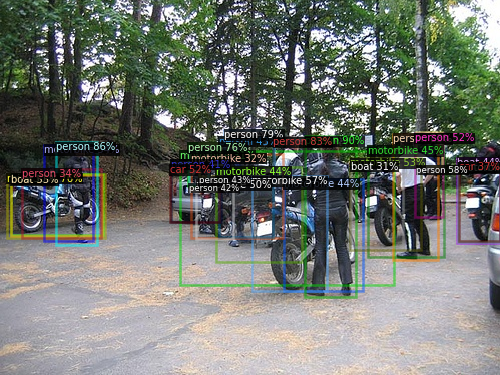

Instances(num_instances=14, image_height=269, image_width=360, fields=[pred_boxes: Boxes(tensor([[ 59.9977, 147.5137,  75.1975, 161.9011],
        [ 78.2011, 206.8857,  91.9090, 219.4237],
        [ 64.3853, 208.6398,  78.8199, 219.8741],
        [ 97.3190, 190.1538, 107.6974, 217.6109],
        [ 17.1212, 201.7671,  30.2814, 218.7979],
        [104.7957, 188.4527, 113.6362, 218.5437],
        [276.8820,  39.6187, 319.2791,  78.3092],
        [206.7183, 143.9593, 241.9886, 176.7807],
        [ 69.0613, 209.5144,  83.2737, 219.5947],
        [ 39.7231,   3.2298, 349.4945, 238.9798],
        [ 29.7987, 144.6751, 113.0075, 201.5955],
        [ 90.5725, 189.9206, 100.0502, 217.3434],
        [ 98.1098, 189.8398, 108.5697, 205.1824],
        [  0.7602, 206.5480,  53.6632, 256.3451]], device='cuda:0')), scores: tensor([0.8497, 0.7988, 0.7686, 0.7063, 0.6273, 0.6135, 0.6096, 0.5201, 0.4775,
        0.4158, 0.4110, 0.4008, 0.3264, 0.3063], device='cuda:0'), pred_classes: tensor([14, 14, 14, 14

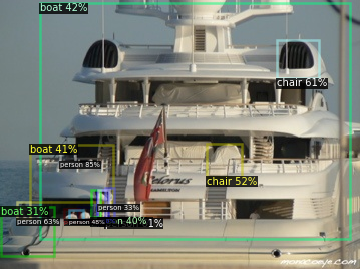

Instances(num_instances=9, image_height=375, image_width=500, fields=[pred_boxes: Boxes(tensor([[171.3572, 116.2655, 412.6042, 315.8982],
        [  0.0000,  20.8842, 500.0000, 349.2921],
        [186.8697, 123.2573, 416.2664, 292.7572],
        [239.7571, 111.7799, 465.2368, 271.3072],
        [ 88.6555,  70.3755, 494.4588, 316.7841],
        [  5.8649,  30.1964, 500.0000, 345.3401],
        [118.8982,  34.4041, 425.6732, 243.0786],
        [128.0000,  44.3302, 406.4845, 334.9983],
        [200.3119, 115.4124, 432.6445, 294.3858]], device='cuda:0')), scores: tensor([0.8810, 0.4716, 0.3933, 0.3772, 0.3543, 0.3536, 0.3133, 0.3055, 0.3034],
       device='cuda:0'), pred_classes: tensor([11, 11,  7, 11,  7,  8, 11,  9,  2], device='cuda:0')])


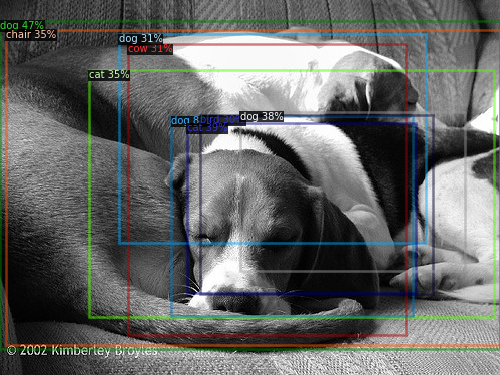

Instances(num_instances=2, image_height=375, image_width=500, fields=[pred_boxes: Boxes(tensor([[  4.0374,  13.9953,  87.1315, 135.2883],
        [ 69.2732,  12.4529, 162.4779, 133.7234]], device='cuda:0')), scores: tensor([0.3061, 0.3016], device='cuda:0'), pred_classes: tensor([8, 8], device='cuda:0')])


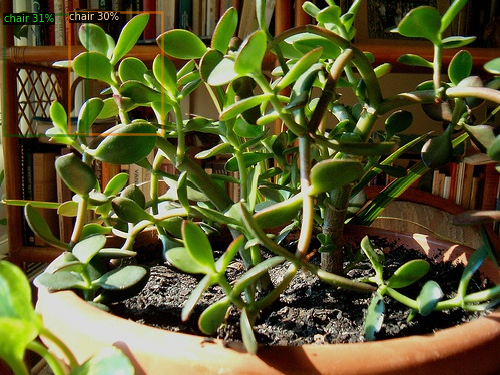

Instances(num_instances=1, image_height=494, image_width=500, fields=[pred_boxes: Boxes(tensor([[141.2956, 294.5222, 390.3781, 357.3377]], device='cuda:0')), scores: tensor([0.6604], device='cuda:0'), pred_classes: tensor([6], device='cuda:0')])


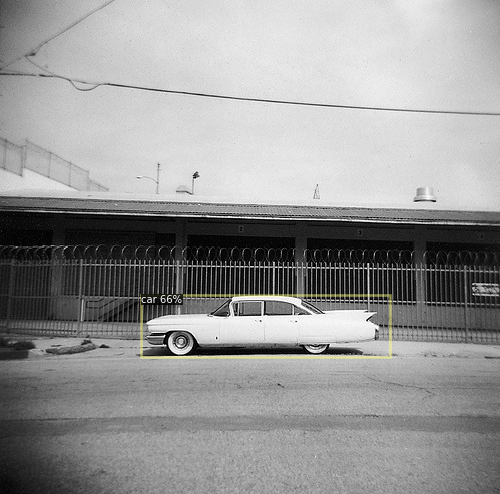

In [31]:
from detectron2.utils.visualizer import ColorMode

META = MetadataCatalog.get("voc_2007_val")

dataset_dicts = pascal_voc.load_voc_instances("datasets/VOC2007","val",pascal_voc.CLASS_NAMES)

print(len(dataset_dicts))
for d in random.sample(dataset_dicts, 10):
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=  META, 
                   scale=1

    )
    print(outputs["instances"])
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])




## Evaluate

In [32]:
from detectron2.evaluation import PascalVOCDetectionEvaluator

In [33]:
eval = PascalVOCDetectionEvaluator("voc_2007_val")

META = MetadataCatalog.get("voc_2007_val")

val_sets = pascal_voc.load_voc_instances("datasets/VOC2007","val",pascal_voc.CLASS_NAMES)

eval.reset()

outputs =[]

c=0
for i in val_sets:
    if c%100==0:
      print(c)
    c+=1
    im = cv2.imread(i["file_name"])
    output = predictor(im) 
    outputs.append(output)


# print(outputs)
eval.process(val_sets,outputs)
eval.evaluate()



0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
[09/02 04:14:56 d2.evaluation.pascal_voc_evaluation]: Evaluating voc_2007_val using 2007 metric. Note that results do not use the official Matlab API.


OrderedDict([('bbox',
              {'AP': 44.5905104722836,
               'AP50': 62.93890851119229,
               'AP75': 48.29971539002378})])